<a href="https://colab.research.google.com/github/tancik/fourier-feature-networks/blob/master/Demo.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [77]:
import jax
import jax.numpy as np
from jax import jit, grad, random
from jax.experimental import stax, optimizers

import matplotlib.pyplot as plt
from tqdm.notebook import tqdm as tqdm
import os, imageio
import numpy

rand_key = random.PRNGKey(0)

In [242]:




def setup_img_data(url):
    img = imageio.imread(url)[..., :3] / 255.
    coords = np.linspace(0, 1, img.shape[0], endpoint=False)
    x_test = np.stack(np.meshgrid(coords, coords), -1)
    idxs = numpy.arange(0,500*500)
    numpy.random.shuffle(idxs)
    npImage = numpy.array(img)
    npTest = numpy.array(x_test)
    temp_test = numpy.zeros((408,408,2))
    temp_img = numpy.zeros((408,408,3))

    temp_test_2 = numpy.zeros((92,92,2))
    temp_img_2 = numpy.zeros((92,92,3))
    for i in range(408):
        for j in range(408):
            k = 408*i + j
            temp_test[i][j] = npTest[idxs[k]//500][idxs[k]%500]
            temp_img[i][j] = npImage[idxs[k]//500][idxs[k]%500]
        
    for i in range(92):
        for j in range(92):
            k = (408*408)+92*i + j
            temp_test_2[i][j] = npTest[idxs[k]//500][idxs[k]%500]
            temp_img_2[i][j] = npImage[idxs[k]//500][idxs[k]%500]

    train_data = [temp_test, temp_img]
    test_data = [temp_test_2, temp_img_2]
    plt.figure(figsize=(20,6))
    plt.subplot(1,3,1)
    plt.imshow(img)
    plt.title("Image")
    plt.subplot(1,3,2)
    plt.imshow(train_data[1])
    plt.title("2/3 Random Train")
    plt.subplot(1,3,3)
    plt.imshow(test_data[1])
    plt.title("1/3 Random Test")
    plt.show()
    return train_data,test_data,x_test,img

    


In [112]:
# Fourier feature mapping
def input_mapping(x, B): 
  if B is None:
    return x
  else:
    x_proj = (2.*np.pi*x) @ B.T
    return np.concatenate([np.sin(x_proj), np.cos(x_proj)], axis=-1)


# JAX network definition
def make_network(num_layers, num_channels):
    layers = []
    for i in range(num_layers-1):
        layers.append(stax.Dense(num_channels))
        layers.append(stax.Relu)
    layers.append(stax.Dense(3))
    layers.append(stax.Sigmoid)
    return stax.serial(*layers)


# Train model with given hyperparameters and data
def train_model(network_size, learning_rate, iters, B, train_data, test_data):

    init_fn, apply_fn = make_network(*network_size)

    model_pred = jit(lambda params, x: apply_fn(params, input_mapping(x, B)))
    model_loss = jit(lambda params, x, y: np.mean((model_pred(params, x) - y) ** 2))
    #model_psnr = jit(lambda params, x, y: -10 * np.log10(2.*model_loss(params, x, y)))
    model_rmse = jit(lambda params, x, y: np.sqrt(model_loss(params, x, y)))
    model_grad_loss = jit(lambda params, x, y: jax.grad(model_loss)(params, x, y))

    opt_init, opt_update, get_params = optimizers.adam(learning_rate)
    opt_update = jit(opt_update)

    _, params = init_fn(rand_key, (-1, input_mapping(train_data[0], B).shape[-1]))
    opt_state = opt_init(params)

    #train_psnrs = []
    #test_psnrs = []
    train_rmses = []
    test_rmses = []
    pred_imgs = []
    xs = []
    for i in tqdm(range(iters), desc='train iter', leave=False):
        opt_state = opt_update(i, model_grad_loss(get_params(opt_state), *train_data), opt_state)

        if i % 25 == 0:
            train_rmses.append(model_rmse(get_params(opt_state), *train_data))
            test_rmses.append(model_rmse(get_params(opt_state), *test_data))
            pred_imgs.append(model_pred(get_params(opt_state), test_data[0]))
            xs.append(i)
    
    return {
        'state': get_params(opt_state),
        'train_rmses': train_rmses,
        'test_rmses': test_rmses,
        'pred_imgs' : np.stack(pred_imgs),
        'xs': xs,
    }

def train_model2(network_size, learning_rate, iters, B, train_data, test_data, full_test):

    init_fn, apply_fn = make_network(*network_size)

    model_pred = jit(lambda params, x: apply_fn(params, input_mapping(x, B)))
    model_loss = jit(lambda params, x, y: np.mean((model_pred(params, x) - y) ** 2))
    model_rmse = jit(lambda params, x, y: np.sqrt(model_loss(params, x, y)))
    model_grad_loss = jit(lambda params, x, y: jax.grad(model_loss)(params, x, y))

    opt_init, opt_update, get_params = optimizers.adam(learning_rate)
    opt_update = jit(opt_update)

    _, params = init_fn(rand_key, (-1, input_mapping(train_data[0], B).shape[-1]))
    opt_state = opt_init(params)

    #train_rmses = []
    #test_rmses = []
    #pred_imgs = []
    #xs = []
    for i in tqdm(range(iters), desc='train iter', leave=False):
        opt_state = opt_update(i, model_grad_loss(get_params(opt_state), *train_data), opt_state)
        
    train_rmse = model_rmse(get_params(opt_state), *train_data)
    test_rmse = model_rmse(get_params(opt_state), *test_data)
    pred_img = model_pred(get_params(opt_state), full_test)
    
    return [train_rmse, test_rmse, pred_img]

In [241]:
network_size = (4, 256)
learning_rate = 1e-4
iters = 2000
mapping_size = 256

def train_multiple(network_size, learning_rate, iters, embedding, train_data, test_data, x_test):
    res = []
    for x in range(len(train_data)):
        res.append(train_model2(network_size, learning_rate, iters, embedding, train_data[x], test_data[x], x_test[x]))
    return res

## Images and Random Test/Train

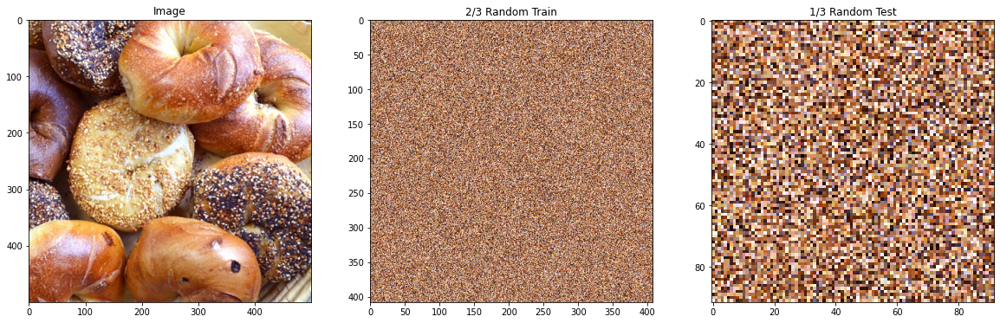

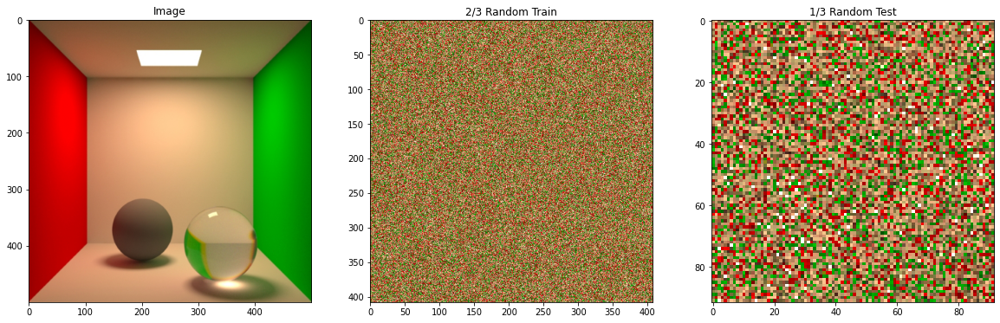

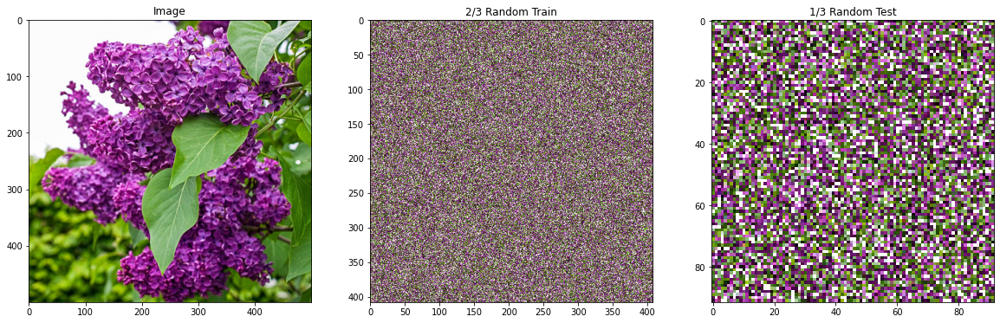

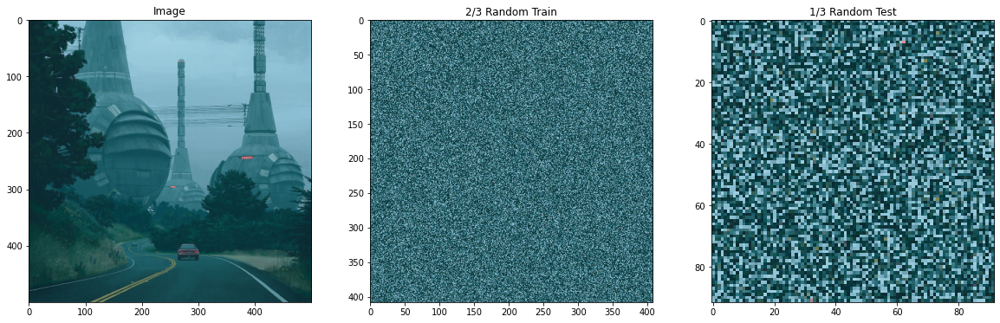

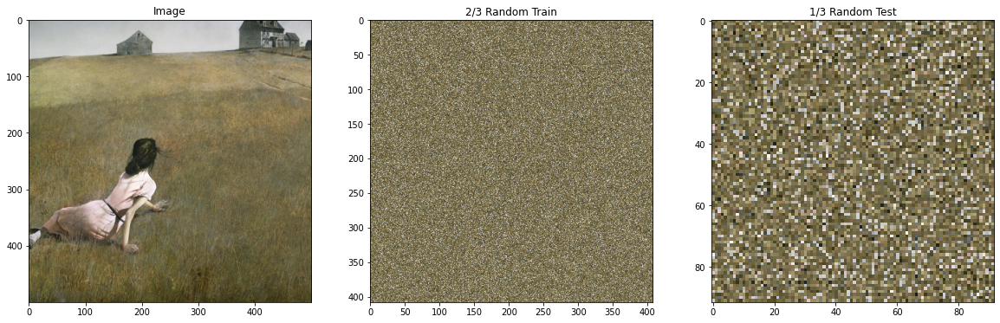

In [243]:
train_data = []
test_data = []
x_test = []
img = []
urls = ['https://i.imgur.com/FoQxhey.jpg','https://i.imgur.com/egM3E2j.jpg', 'https://i.imgur.com/YH2plZp.jpg', 
        'https://i.imgur.com/FWVFYQx.jpg', 'https://i.imgur.com/iusv5XS.png']

for url in urls:
    r1,r2,r3,r4 = setup_img_data(url)
    train_data.append(r1)
    test_data.append(r2)
    x_test.append(r3)
    img.append(r4)
    

In [191]:
no_embedding_models = train_multiple(network_size, learning_rate, iters, None, train_data, test_data, x_test)

train iter:   0%|          | 0/2000 [00:00<?, ?it/s]

train iter:   0%|          | 0/2000 [00:00<?, ?it/s]

train iter:   0%|          | 0/2000 [00:00<?, ?it/s]

train iter:   0%|          | 0/2000 [00:00<?, ?it/s]

train iter:   0%|          | 0/2000 [00:00<?, ?it/s]

In [244]:
#[train_rmse, test_rmse, pred_img]
def plot_model(model, image):
    plt.figure(figsize=(12,6))
    plt.subplot(1,2,1)
    plt.imshow(model[2])
    plt.title("No Embedding - Test RMSE = "+str(model[1]))
    plt.subplot(1,2,2)
    plt.imshow(image)
    plt.title("Ground Truth")
    plt.show()

## No Embedding

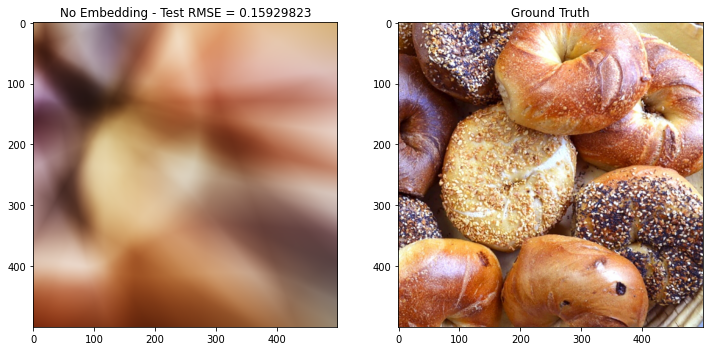

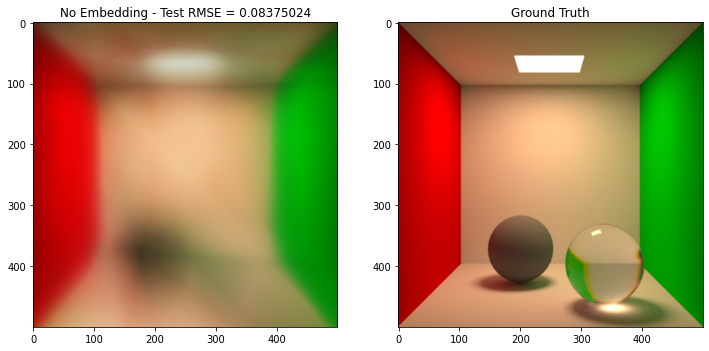

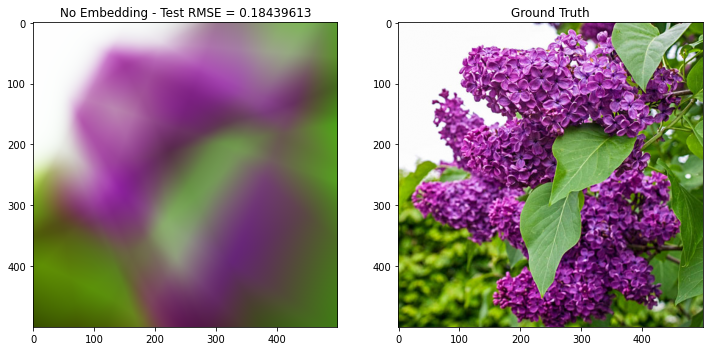

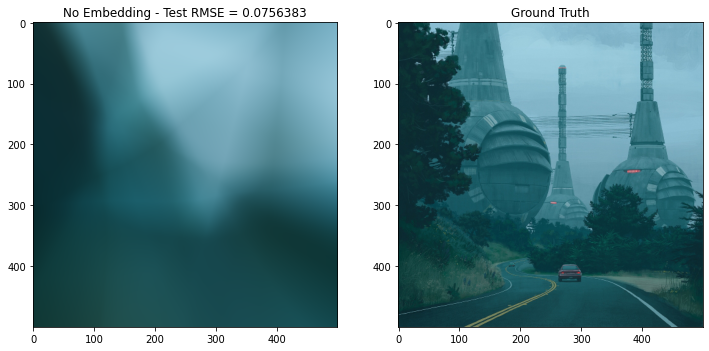

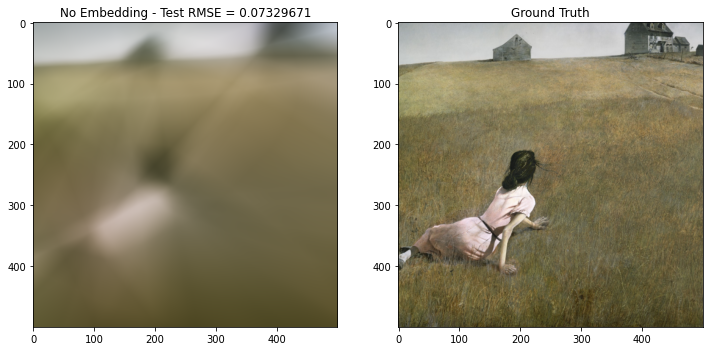

In [211]:
for i in range(len(img)):
    plot_model(no_embedding_models[i],img[i] )

In [236]:
dims = [64,128,192,256]
def train_variable_dim(dims, network_size, learning_rate, iters, train_data, test_data, x_test):
    res = []
    for x in range(len(dims)):
        B_gauss = random.normal(rand_key, (dims[x], 2))
        embedding = B_gauss*10.0
        res.append(train_model2(network_size, learning_rate, iters, embedding, train_data, test_data, x_test))
    return res



scales = [1.,4.,9.,16.,25.,36.,49.,64.,81., 100.]
def train_variable_sigma(scales, network_size, learning_rate, iters, train_data, test_data, x_test):
    res = []
    for x in range(len(scales)):
        B_gauss = random.normal(rand_key, (256, 2))
        embedding = B_gauss*scales[x]
        res.append(train_model2(network_size, learning_rate, iters, embedding, train_data, test_data, x_test))
    return res

In [239]:
def plot_imgs(models, variable, img_idx, label):
    if len(models) > 5:
        r = 3
    else:
        r = 1
    plt.figure(figsize=(24,12))
    for i in range(len(models)):
        plt.subplot(r,5,i+1)
        plt.imshow(models[i][2])
        plt.title(label+": "+str(variable[i]))
    plt.subplot(r,5,len(models)+1)
    plt.imshow(img[img_idx])
    plt.title('Ground Truth')
    plt.show()
def plot_error(models, variable, img_idx, label):
    train_errs = []
    test_errs = []
    for x in range(len(models)):
        train_errs.append(models[x][0])
        test_errs.append(models[x][1])
    
    plt.figure(figsize=(16,6))
    plt.subplot(121)
    plt.plot(variable, train_errs, label = "Gauss")
    plt.plot(variable, [no_embedding_models[img_idx][0]]*len(models), label = "No Embedding" )
    plt.title('Train error')
    plt.ylabel('RMSE')
    plt.xlabel(label)
    plt.legend()

    plt.subplot(122)
    plt.plot(variable, test_errs, label = "Gauss")
    plt.plot(variable, [no_embedding_models[img_idx][1]]*len(models), label = "No Embedding" )
    plt.title('Test error')
    plt.ylabel('RMSE')
    plt.xlabel(label)
    plt.legend()
    plt.show()



## Dimension's Effect on RMSE

train iter:   0%|          | 0/2000 [00:00<?, ?it/s]

train iter:   0%|          | 0/2000 [00:00<?, ?it/s]

train iter:   0%|          | 0/2000 [00:00<?, ?it/s]

train iter:   0%|          | 0/2000 [00:00<?, ?it/s]

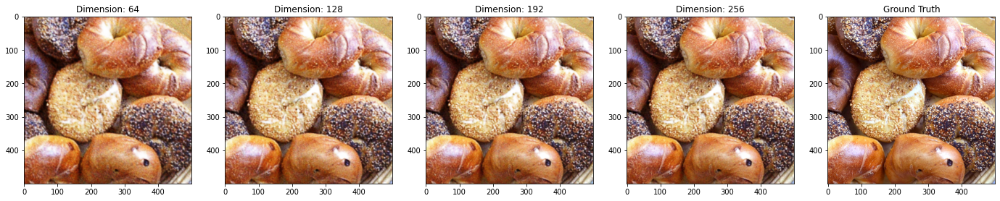

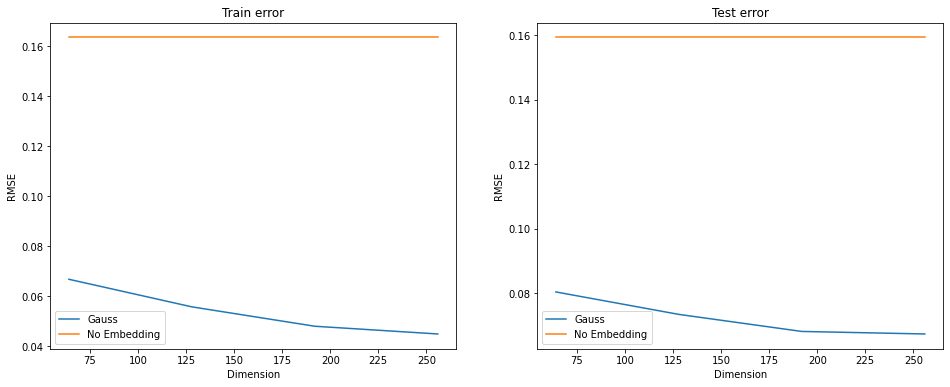

train iter:   0%|          | 0/2000 [00:00<?, ?it/s]

train iter:   0%|          | 0/2000 [00:00<?, ?it/s]

train iter:   0%|          | 0/2000 [00:00<?, ?it/s]

train iter:   0%|          | 0/2000 [00:00<?, ?it/s]

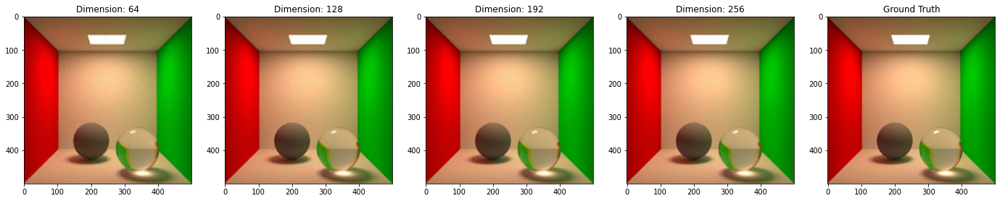

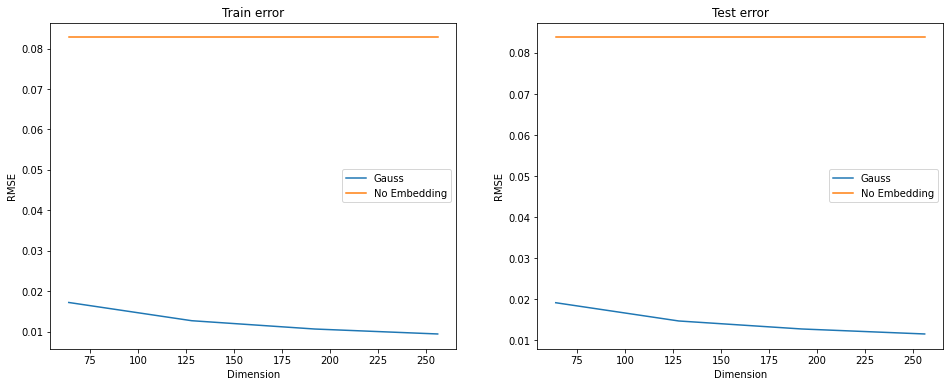

train iter:   0%|          | 0/2000 [00:00<?, ?it/s]

train iter:   0%|          | 0/2000 [00:00<?, ?it/s]

train iter:   0%|          | 0/2000 [00:00<?, ?it/s]

train iter:   0%|          | 0/2000 [00:00<?, ?it/s]

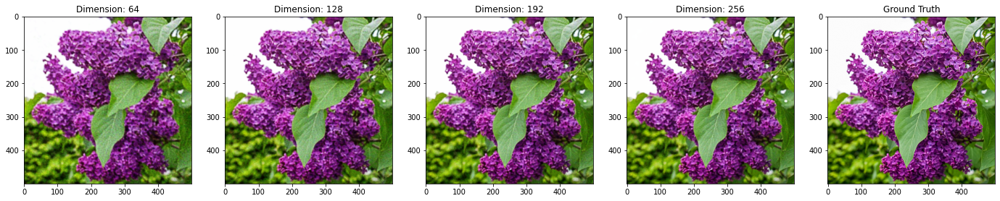

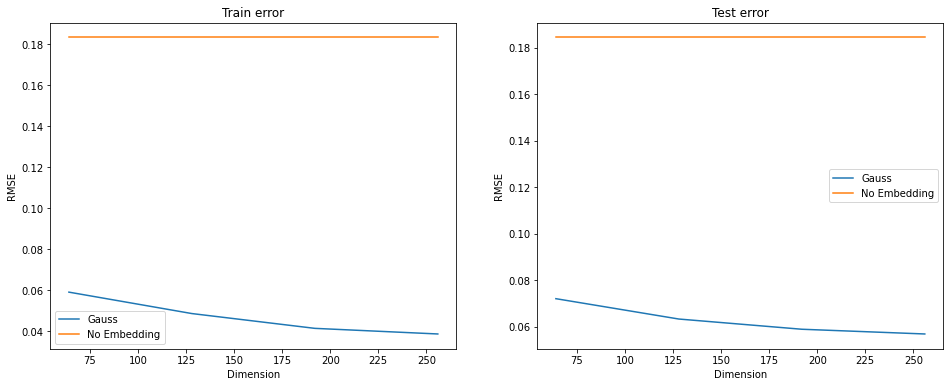

train iter:   0%|          | 0/2000 [00:00<?, ?it/s]

train iter:   0%|          | 0/2000 [00:00<?, ?it/s]

train iter:   0%|          | 0/2000 [00:00<?, ?it/s]

train iter:   0%|          | 0/2000 [00:00<?, ?it/s]

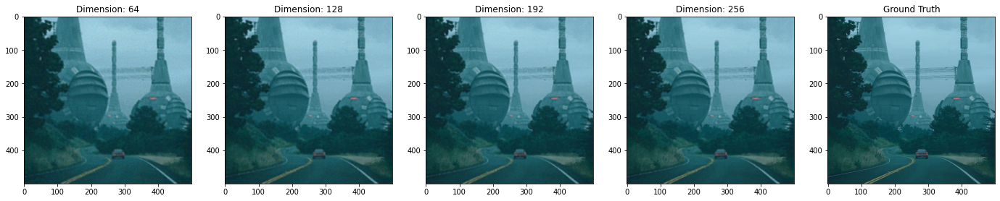

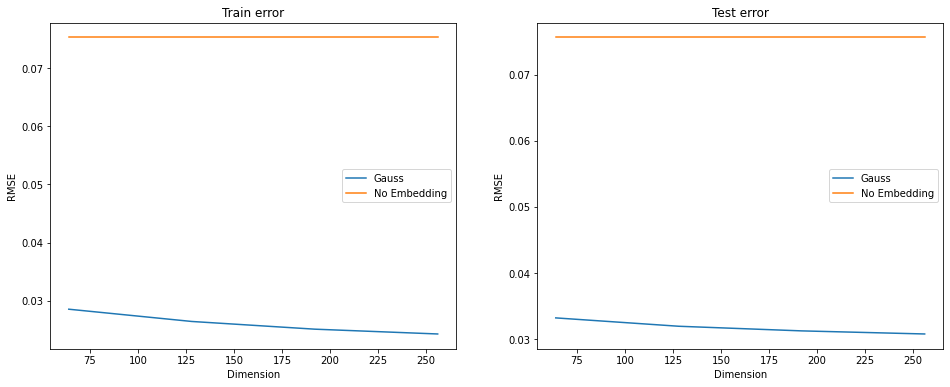

train iter:   0%|          | 0/2000 [00:00<?, ?it/s]

train iter:   0%|          | 0/2000 [00:00<?, ?it/s]

train iter:   0%|          | 0/2000 [00:00<?, ?it/s]

train iter:   0%|          | 0/2000 [00:00<?, ?it/s]

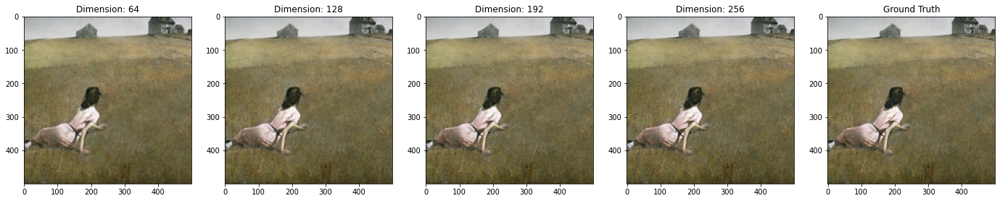

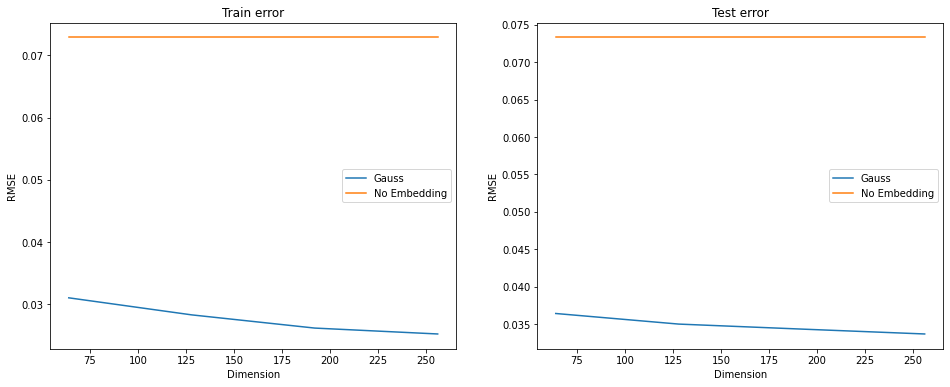

In [235]:
variable_dim_models = []
for i in range(5):
    variable_dim_models.append(train_variable_dim(dims, network_size, learning_rate, iters, train_data[i], test_data[i], x_test[i]))
    plot_imgs(variable_dim_models[i], dims, i, "Dimension")
    plot_error(variable_dim_models[i], dims, i, 'Dimension')
    

In [237]:
variable_sigma_models = []
for i in range(5):
    variable_sigma_models.append(train_variable_sigma(scales, network_size, learning_rate, iters, train_data[i], test_data[i], x_test[i]))


train iter:   0%|          | 0/2000 [00:00<?, ?it/s]

train iter:   0%|          | 0/2000 [00:00<?, ?it/s]

train iter:   0%|          | 0/2000 [00:00<?, ?it/s]

train iter:   0%|          | 0/2000 [00:00<?, ?it/s]

train iter:   0%|          | 0/2000 [00:00<?, ?it/s]

train iter:   0%|          | 0/2000 [00:00<?, ?it/s]

train iter:   0%|          | 0/2000 [00:00<?, ?it/s]

train iter:   0%|          | 0/2000 [00:00<?, ?it/s]

train iter:   0%|          | 0/2000 [00:00<?, ?it/s]

train iter:   0%|          | 0/2000 [00:00<?, ?it/s]

train iter:   0%|          | 0/2000 [00:00<?, ?it/s]

train iter:   0%|          | 0/2000 [00:00<?, ?it/s]

train iter:   0%|          | 0/2000 [00:00<?, ?it/s]

train iter:   0%|          | 0/2000 [00:00<?, ?it/s]

train iter:   0%|          | 0/2000 [00:00<?, ?it/s]

train iter:   0%|          | 0/2000 [00:00<?, ?it/s]

train iter:   0%|          | 0/2000 [00:00<?, ?it/s]

train iter:   0%|          | 0/2000 [00:00<?, ?it/s]

train iter:   0%|          | 0/2000 [00:00<?, ?it/s]

train iter:   0%|          | 0/2000 [00:00<?, ?it/s]

train iter:   0%|          | 0/2000 [00:00<?, ?it/s]

train iter:   0%|          | 0/2000 [00:00<?, ?it/s]

train iter:   0%|          | 0/2000 [00:00<?, ?it/s]

train iter:   0%|          | 0/2000 [00:00<?, ?it/s]

train iter:   0%|          | 0/2000 [00:00<?, ?it/s]

train iter:   0%|          | 0/2000 [00:00<?, ?it/s]

train iter:   0%|          | 0/2000 [00:00<?, ?it/s]

train iter:   0%|          | 0/2000 [00:00<?, ?it/s]

train iter:   0%|          | 0/2000 [00:00<?, ?it/s]

train iter:   0%|          | 0/2000 [00:00<?, ?it/s]

train iter:   0%|          | 0/2000 [00:00<?, ?it/s]

train iter:   0%|          | 0/2000 [00:00<?, ?it/s]

train iter:   0%|          | 0/2000 [00:00<?, ?it/s]

train iter:   0%|          | 0/2000 [00:00<?, ?it/s]

train iter:   0%|          | 0/2000 [00:00<?, ?it/s]

train iter:   0%|          | 0/2000 [00:00<?, ?it/s]

train iter:   0%|          | 0/2000 [00:00<?, ?it/s]

train iter:   0%|          | 0/2000 [00:00<?, ?it/s]

train iter:   0%|          | 0/2000 [00:00<?, ?it/s]

train iter:   0%|          | 0/2000 [00:00<?, ?it/s]

train iter:   0%|          | 0/2000 [00:00<?, ?it/s]

train iter:   0%|          | 0/2000 [00:00<?, ?it/s]

train iter:   0%|          | 0/2000 [00:00<?, ?it/s]

train iter:   0%|          | 0/2000 [00:00<?, ?it/s]

train iter:   0%|          | 0/2000 [00:00<?, ?it/s]

train iter:   0%|          | 0/2000 [00:00<?, ?it/s]

train iter:   0%|          | 0/2000 [00:00<?, ?it/s]

train iter:   0%|          | 0/2000 [00:00<?, ?it/s]

train iter:   0%|          | 0/2000 [00:00<?, ?it/s]

train iter:   0%|          | 0/2000 [00:00<?, ?it/s]

## Sigma's Effect on RMSE

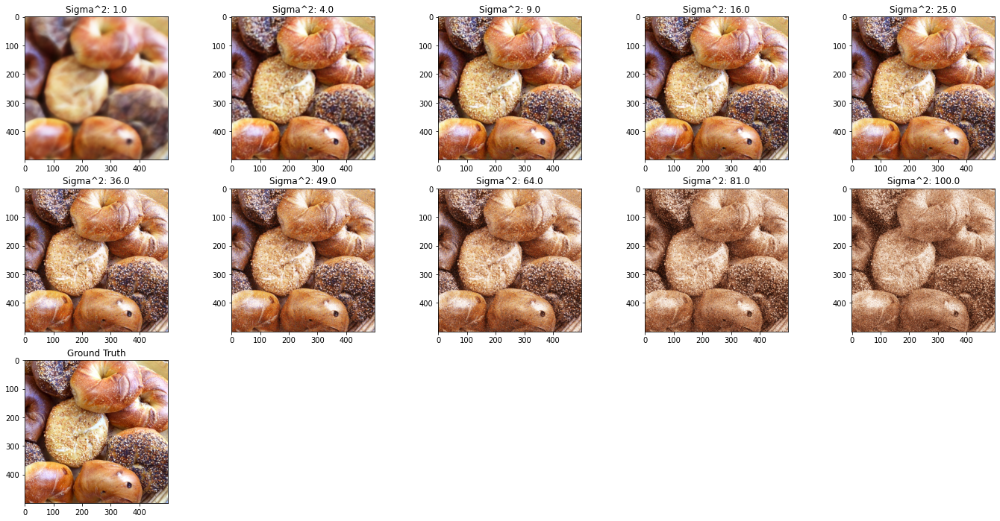

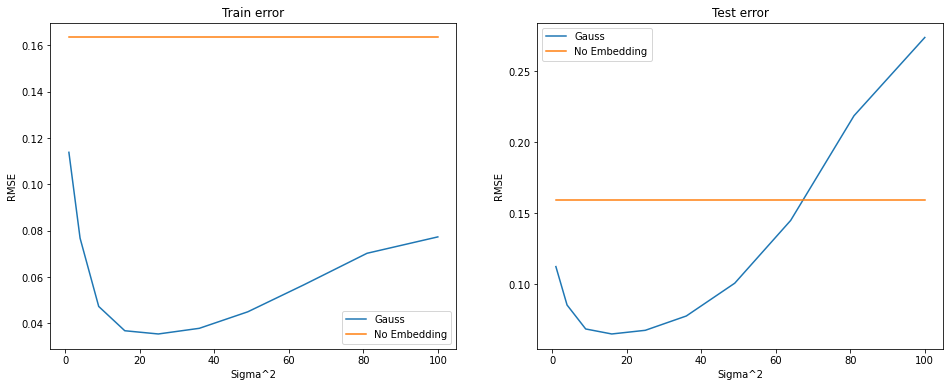

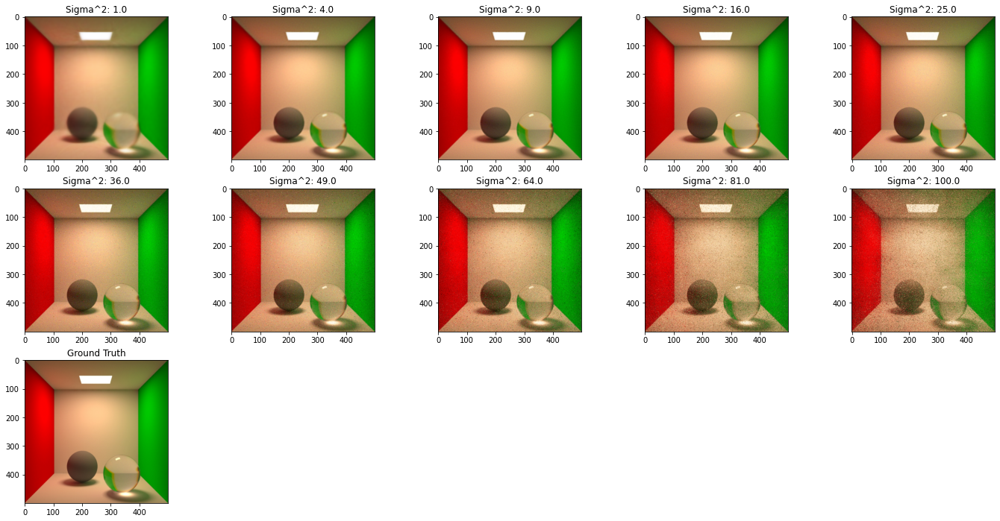

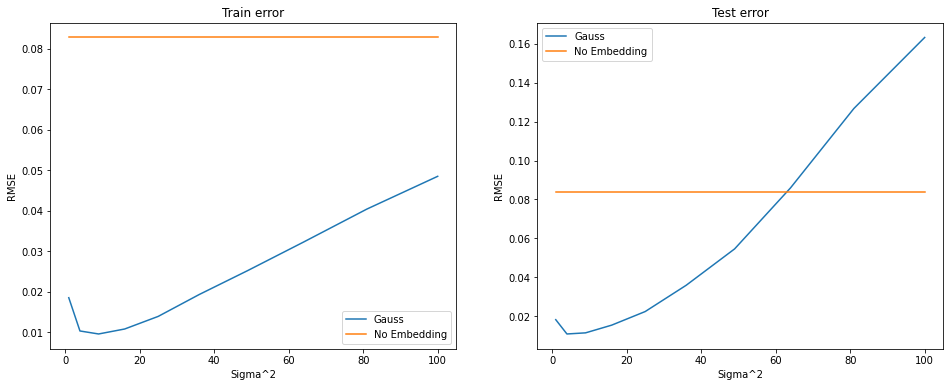

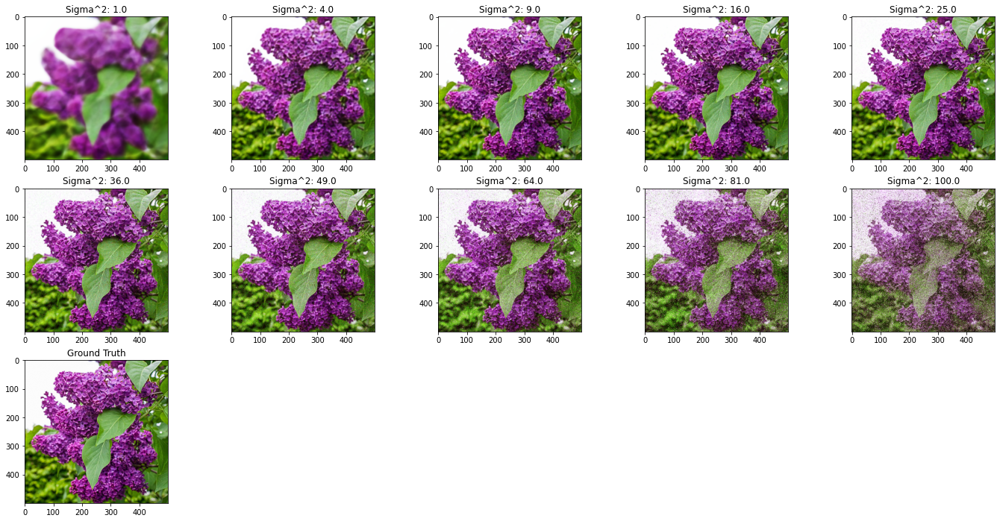

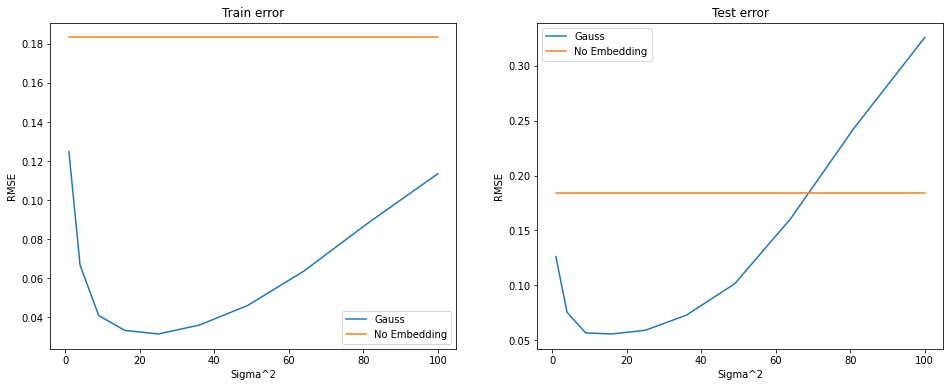

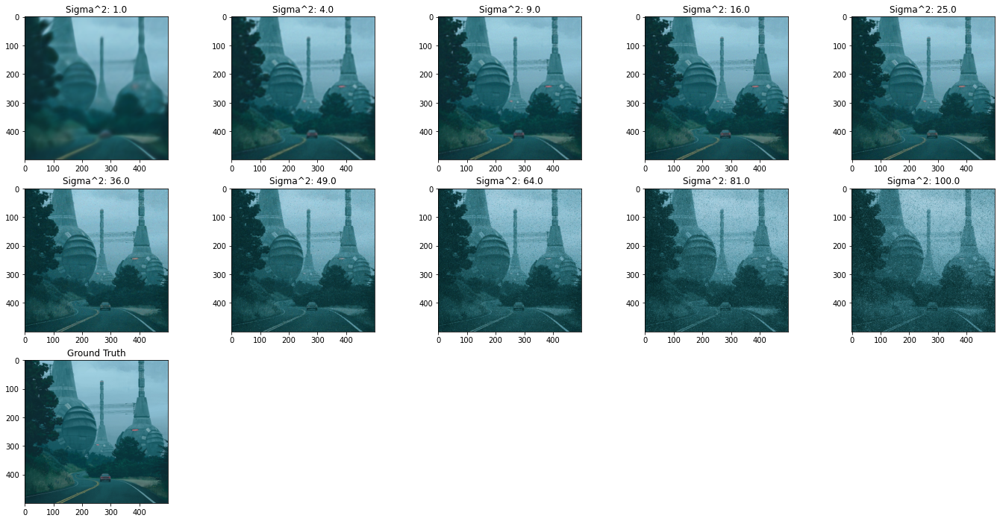

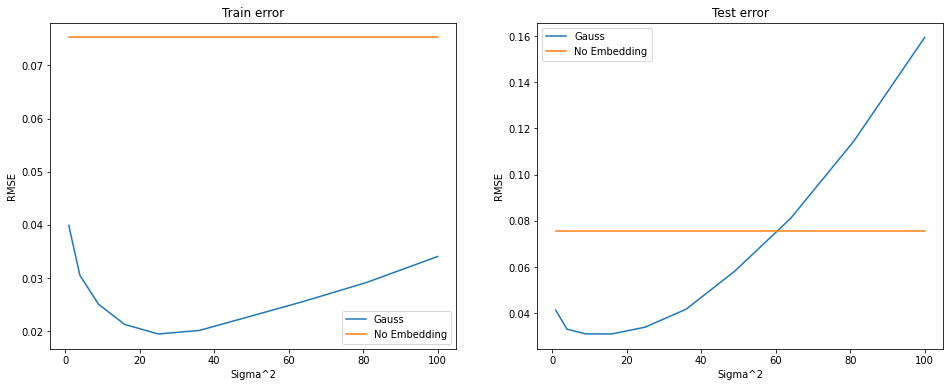

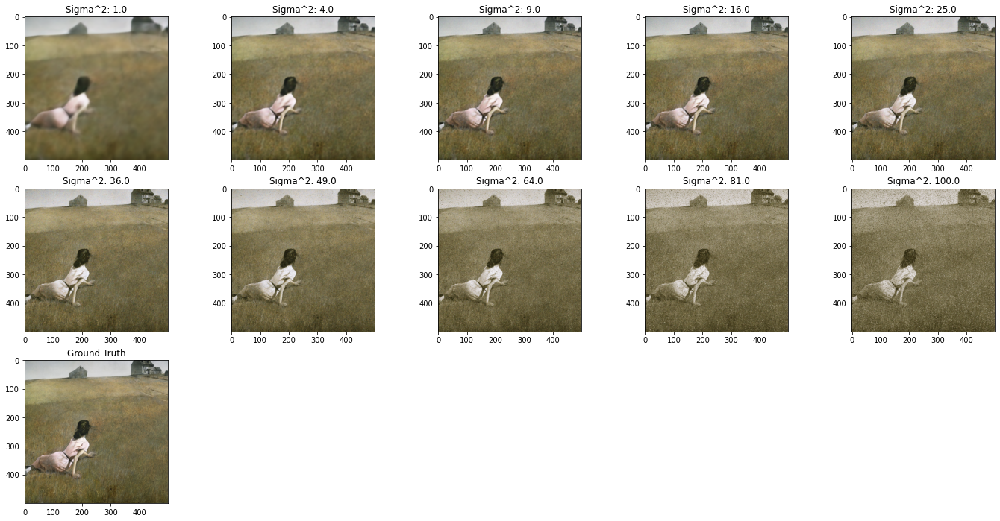

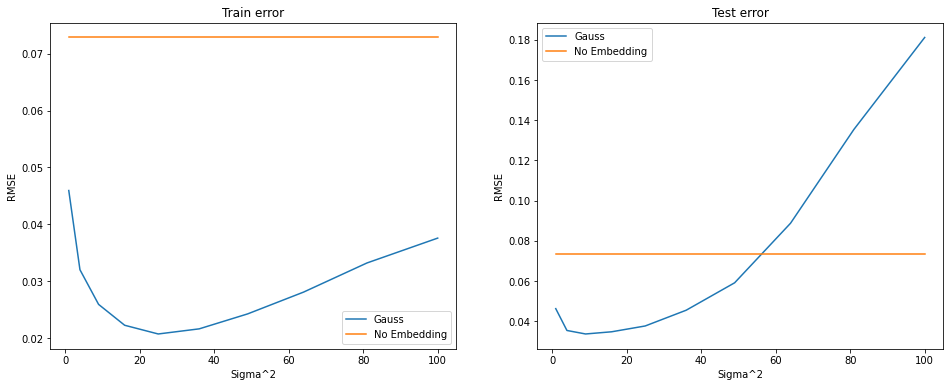

In [240]:
for i in range(5):    
    plot_imgs(variable_sigma_models[i], scales, i, "Sigma^2")
    plot_error(variable_sigma_models[i], scales, i, "Sigma^2")